In [1]:
import easyocr
import cv2
import os
import re
import matplotlib.pyplot as plt
from PIL import Image, ImageDraw, ImageFont
import matplotlib.font_manager as fm
import Levenshtein
import math


reader = easyocr.Reader(['ru'], gpu=True)

малое среднее предпринимательство 0.4817042606516291

image 1/1 /home/dmitrii/Desktop/hack_22_06_24_school_of_programming/data/original/culture/Примеры корректного брендирования/photo_2023-02-11_19-43-57.jpg: 448x640 (no detections), 73.0ms
Speed: 1.0ms preprocess, 73.0ms inference, 5.5ms postprocess per image at shape (1, 3, 448, 640)


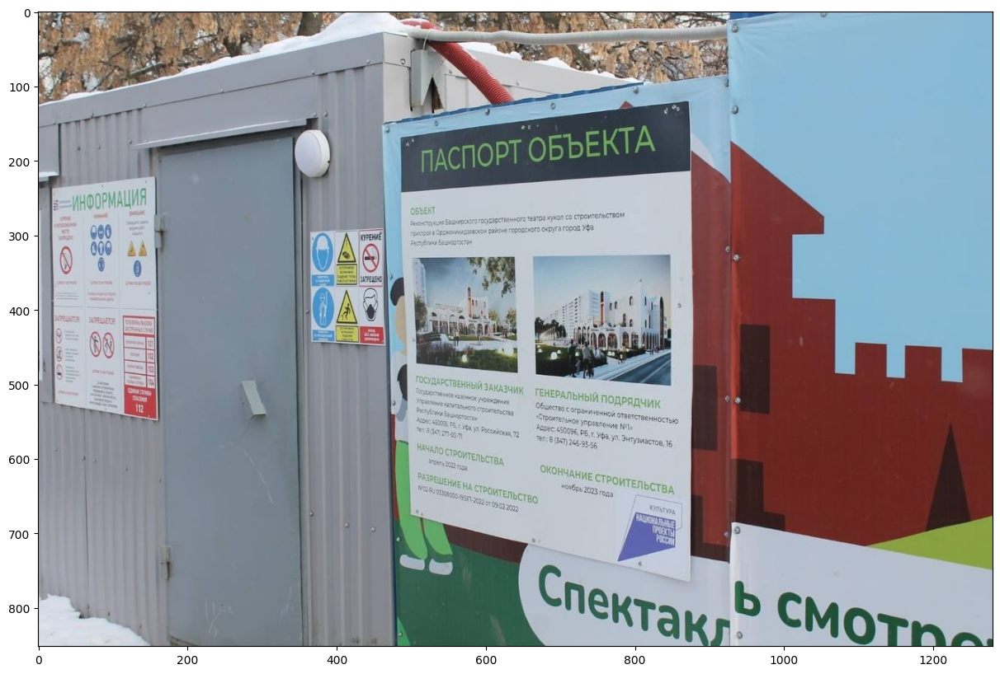

образование 0.45454545454545453

image 1/1 /home/dmitrii/Desktop/hack_22_06_24_school_of_programming/data/original/culture/Примеры корректного брендирования/a2528fd3bf0931024d5cb2ed9e382876c475a2f5105f8855c07dc68ec2c3.jpeg.jpg: 448x640 (no detections), 2.5ms
Speed: 1.1ms preprocess, 2.5ms inference, 0.3ms postprocess per image at shape (1, 3, 448, 640)


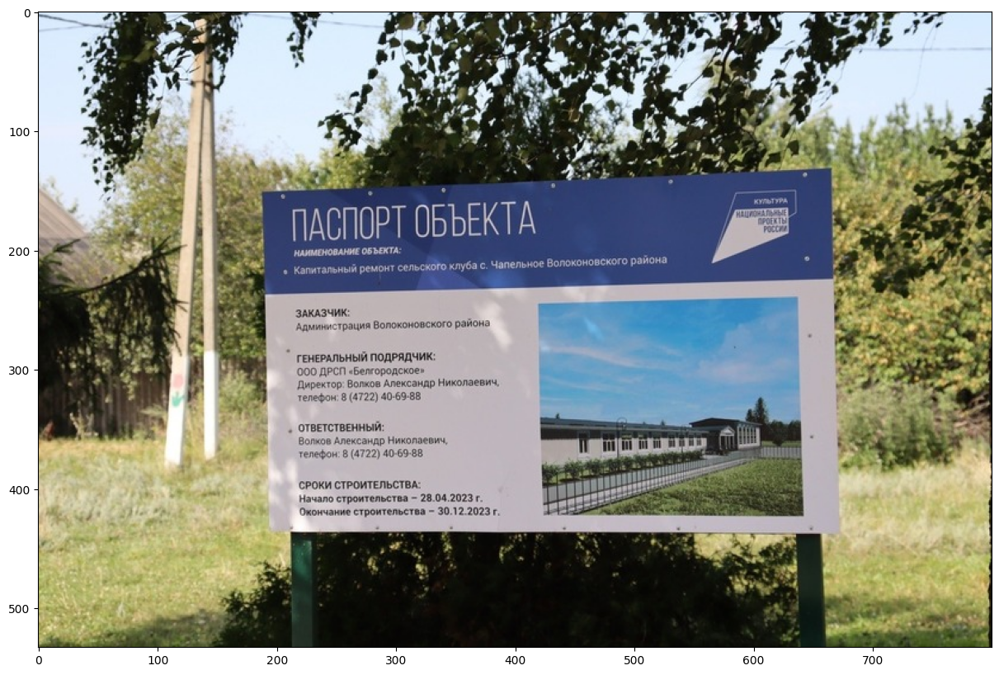

культура 0.125

image 1/1 /home/dmitrii/Desktop/hack_22_06_24_school_of_programming/data/original/culture/Примеры корректного брендирования/kultura80.jpg: 448x640 2 persons, 3.0ms
Speed: 1.0ms preprocess, 3.0ms inference, 283.7ms postprocess per image at shape (1, 3, 448, 640)


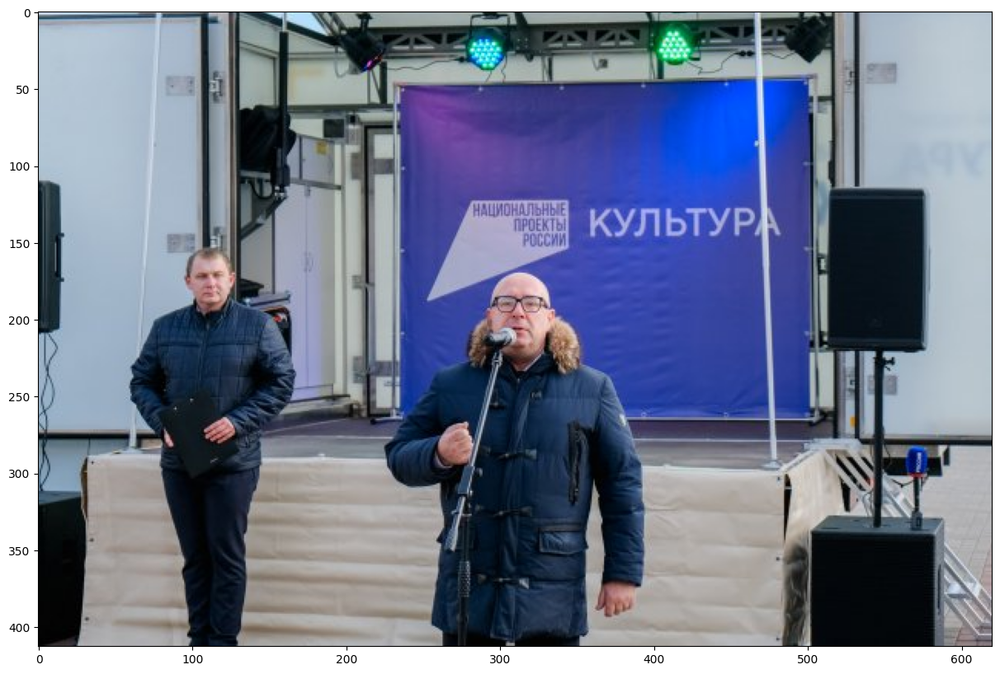

культура 0.125

image 1/1 /home/dmitrii/Desktop/hack_22_06_24_school_of_programming/data/original/culture/Примеры корректного брендирования/kultura20.jpg: 448x640 (no detections), 2.8ms
Speed: 1.2ms preprocess, 2.8ms inference, 0.5ms postprocess per image at shape (1, 3, 448, 640)


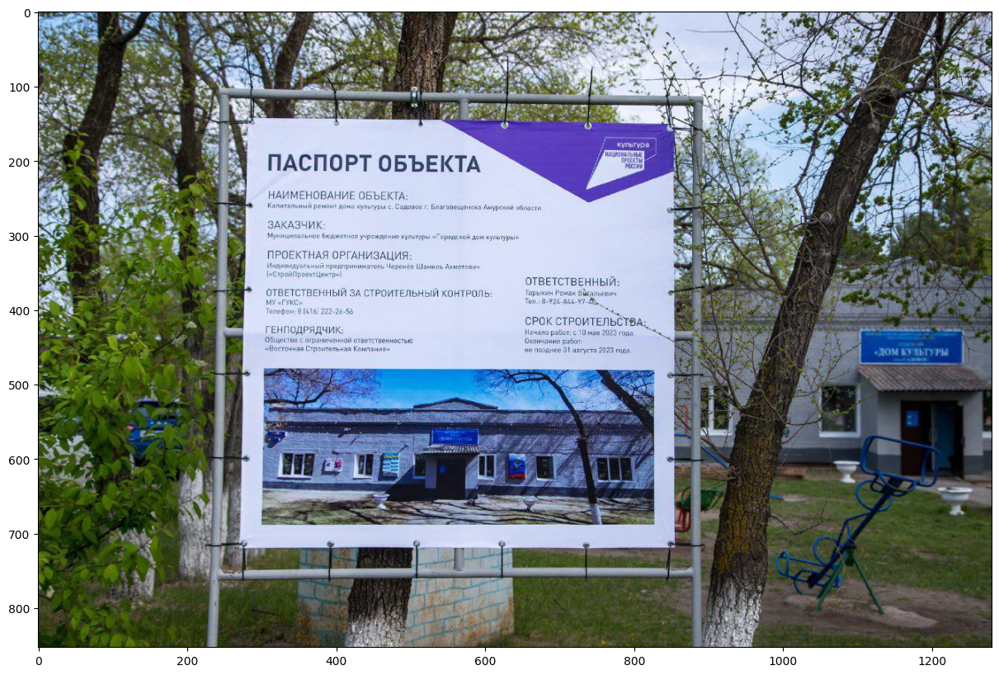

культура 0.25

image 1/1 /home/dmitrii/Desktop/hack_22_06_24_school_of_programming/data/original/culture/Примеры корректного брендирования/kultura17.jpg: 480x640 1 person, 71.6ms
Speed: 1.1ms preprocess, 71.6ms inference, 1.8ms postprocess per image at shape (1, 3, 480, 640)


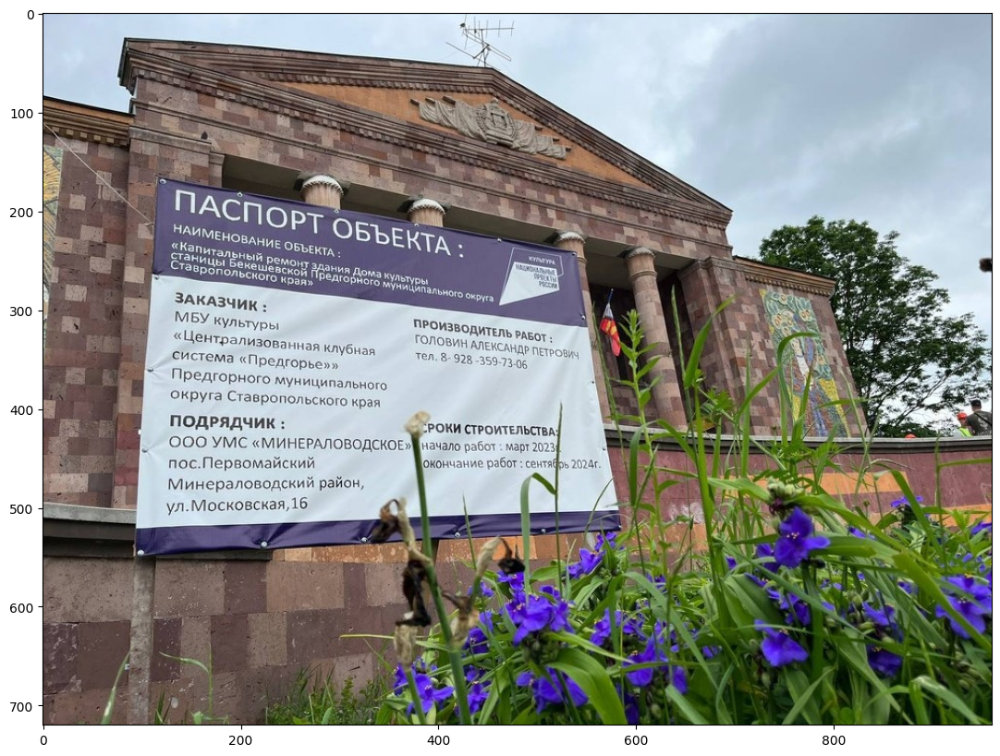

культура 0.125

image 1/1 /home/dmitrii/Desktop/hack_22_06_24_school_of_programming/data/original/culture/Примеры корректного брендирования/photo_2023-10-04_13-01-40.jpg: 384x640 (no detections), 71.0ms
Speed: 1.2ms preprocess, 71.0ms inference, 0.6ms postprocess per image at shape (1, 3, 384, 640)


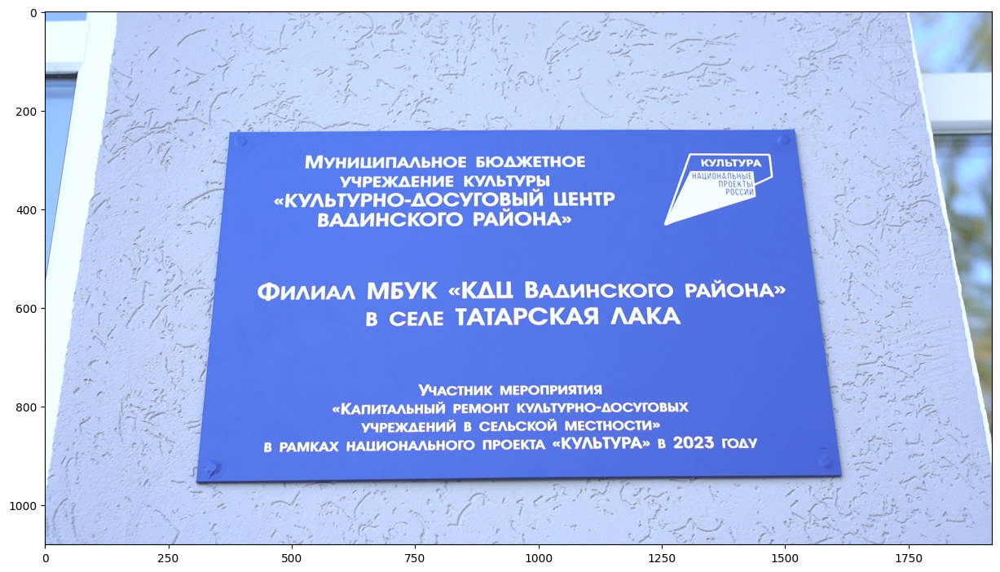

образование 0.5454545454545454

image 1/1 /home/dmitrii/Desktop/hack_22_06_24_school_of_programming/data/original/culture/Примеры корректного брендирования/kultura98.jpg: 480x640 (no detections), 3.3ms
Speed: 1.1ms preprocess, 3.3ms inference, 0.2ms postprocess per image at shape (1, 3, 480, 640)


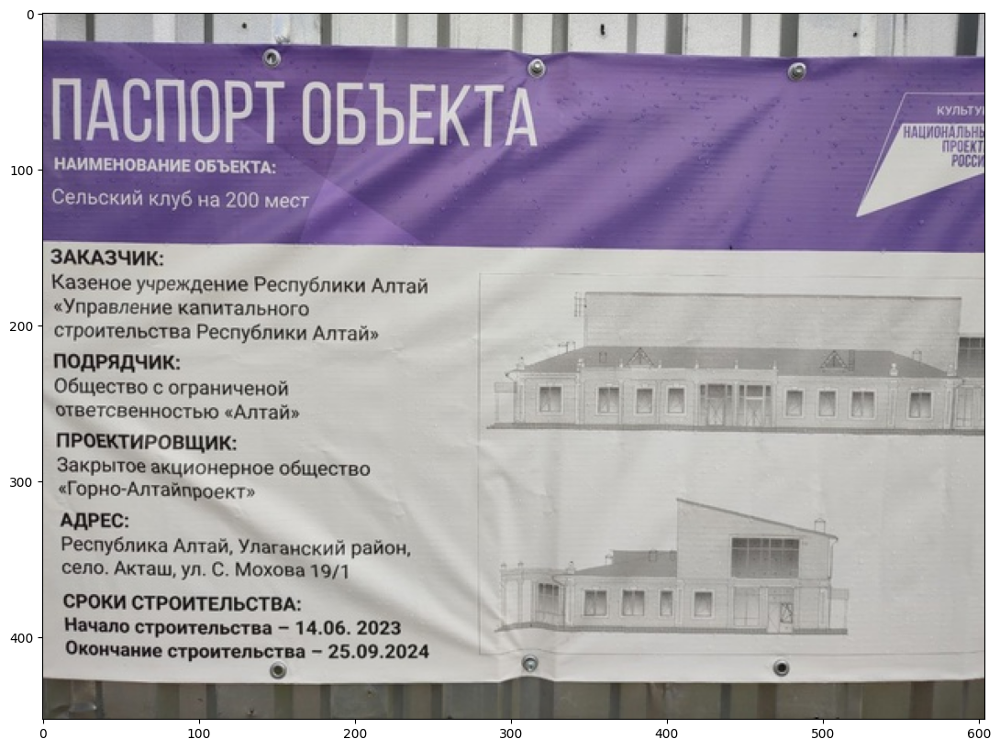

экология 0.75

image 1/1 /home/dmitrii/Desktop/hack_22_06_24_school_of_programming/data/original/culture/Примеры корректного брендирования/kultura79.jpg: 384x640 (no detections), 2.9ms
Speed: 0.7ms preprocess, 2.9ms inference, 0.3ms postprocess per image at shape (1, 3, 384, 640)


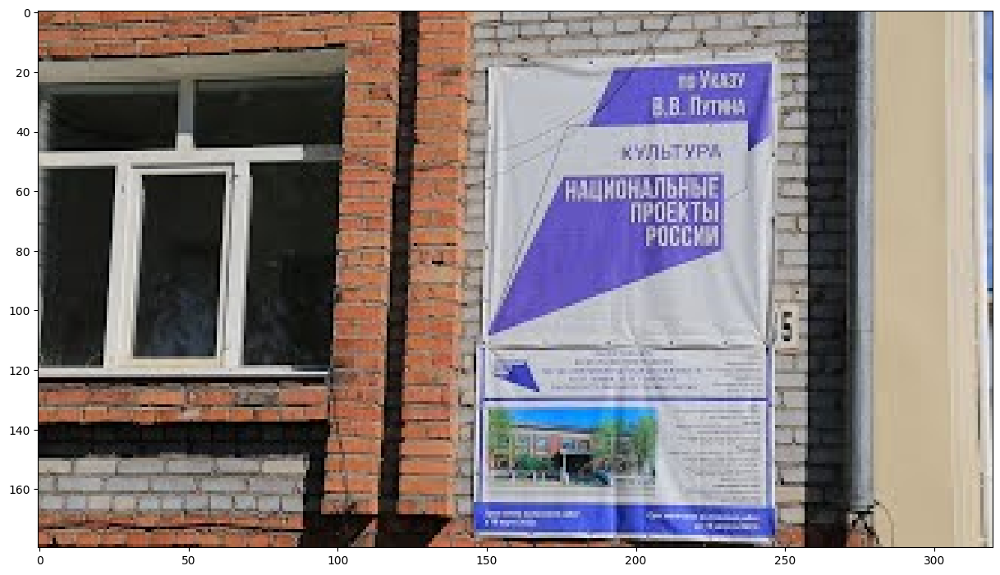

культура 0.25

image 1/1 /home/dmitrii/Desktop/hack_22_06_24_school_of_programming/data/original/culture/Примеры корректного брендирования/kultura102.jpg: 448x640 (no detections), 2.7ms
Speed: 1.2ms preprocess, 2.7ms inference, 0.3ms postprocess per image at shape (1, 3, 448, 640)


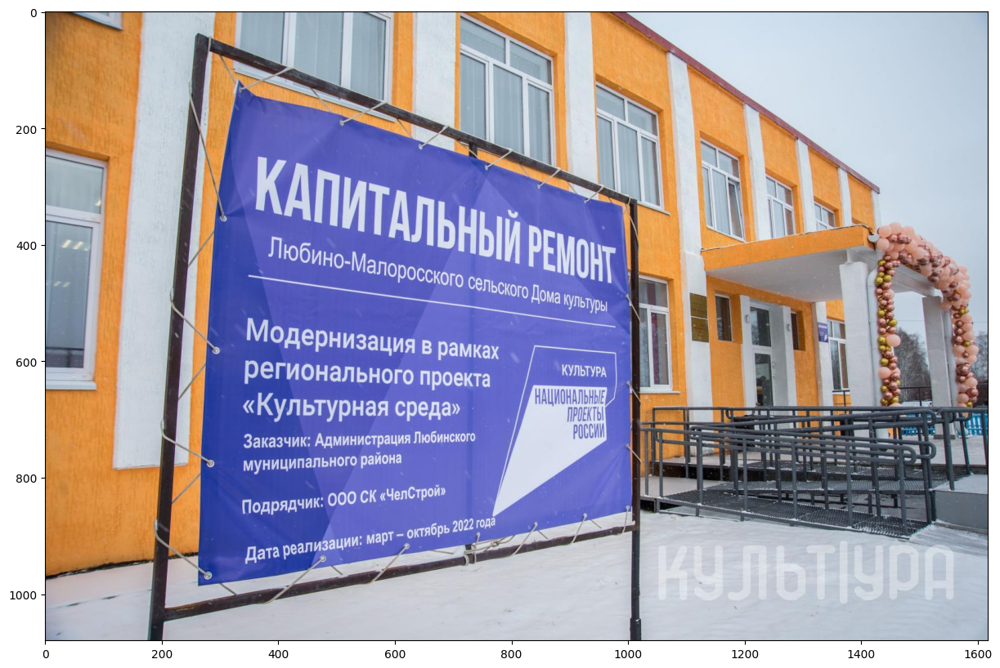

жилье городская среда 0.24444444444444446

image 1/1 /home/dmitrii/Desktop/hack_22_06_24_school_of_programming/data/original/culture/Примеры корректного брендирования/kultura100.jpg: 448x640 (no detections), 2.4ms
Speed: 1.0ms preprocess, 2.4ms inference, 0.3ms postprocess per image at shape (1, 3, 448, 640)


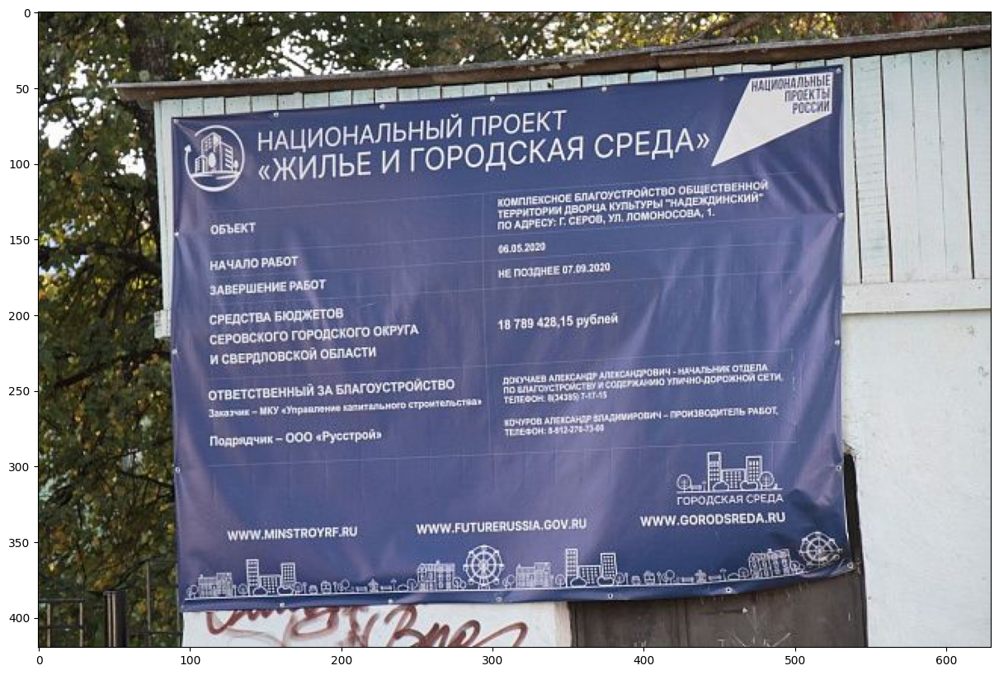

культура 0.625

image 1/1 /home/dmitrii/Desktop/hack_22_06_24_school_of_programming/data/original/culture/Примеры корректного брендирования/kultura39.jpg: 448x640 (no detections), 2.4ms
Speed: 1.0ms preprocess, 2.4ms inference, 0.5ms postprocess per image at shape (1, 3, 448, 640)


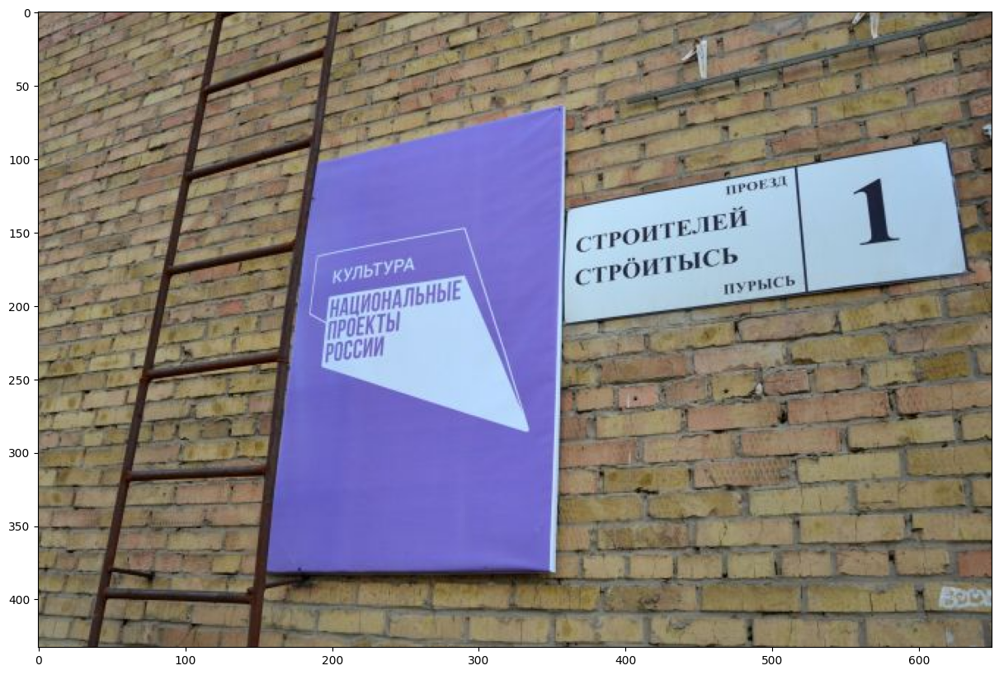

образование 0.5454545454545454



FileNotFoundError: No images or videos found in /home/dmitrii/Desktop/hack_22_06_24_school_of_programming/data/original/culture/Примеры корректного брендирования/kultura78. Supported formats are:
images: {'jpg', 'png', 'mpo', 'webp', 'bmp', 'tiff', 'pfm', 'dng', 'jpeg', 'tif'}
videos: {'mp4', 'mpeg', 'asf', 'wmv', 'gif', 'ts', 'avi', 'mpg', 'webm', 'mkv', 'mov', 'm4v'}

In [3]:
reader = easyocr.Reader(['ru'])
yolov8 = YOLOv8Inference()

def recognize_text(image_path):
    image = cv2.imread(image_path)
    results = reader.readtext(image, detail=0)
    recognized_text = ' '.join(x for x in results if len(x) >= 5)
    return recognized_text

def get_dist(str1, str2):
    dist = Levenshtein.distance(str1, str2)
    return dist / len(str2)


# Функция для классификации текста
def classify_text(text, classes):
    words = re.findall(r'\w+', text.lower())
    class_distances = {}

    for class_keywords in classes:
        distances = []
        best_words = []

        for keyword in class_keywords:
            cur_best = math.inf
            best_word = ''

            for word in words:
                dist = get_dist(word, keyword)

                # Возможно стоит игнорировать слово "образования"

                # Если найдено наименьшее расстояние
                if dist < cur_best:
                    cur_best = dist
                    best_word = word
            
            
            distances.append(cur_best) # Добавляем лучшее расстояние для текущего ключевого слова 
            best_words.append(best_word) # Добавление лучшего слова
        
        average_dist = sum(distances) / len(distances)
        # classification_result[' '.join(class_keywords)] = [average_dist, ' '.join(best_words)]

        class_name = ' '.join(class_keywords)
        class_distances[class_name] = average_dist
    
    best_class = min(class_distances, key=class_distances.get)
    best_distance = class_distances[best_class]

    return best_class, best_distance



names = [
    ['образование'],
    ['демография'],
    ['цифровая', 'экономика'],
    ['наука', 'университеты'],
    ['культура'],
    ['магистральный план', 'энергетическая часть'],
    ['магистральный план', 'транспортная часть'],
    ['безопасные', 'качественные', 'дороги'],
    ['производительность', 'труда'],
    ['малое', 'среднее', 'предпринимательство'],
    ['здравоохранение'],
    ['экология'],
    ['жилье', 'городская', 'среда'],
    ['туризм', 'индустрия', 'гостеприимства'],
    ['международная', 'кооперация', 'экспорт']
]

cur_path = '/home/dmitrii/Desktop/hack_22_06_24_school_of_programming/data/original/culture/Примеры корректного брендирования'

count = 0
for path in os.listdir(cur_path):
    image = cv2.imread(f'{cur_path}/{path}')

    if image is None: continue

    recognized_text = recognize_text(f'{cur_path}/{path}')

    best_class, best_distance = classify_text(recognized_text, names)
    
    if best_class != 'культура' or best_distance != 0:
        print(best_class, best_distance)

        person_detected = yolov8.detect_person(f'{cur_path}/{path}')

        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        plt.figure(figsize=(15, 10))
        plt.imshow(image)
        plt.show()
        
        count += 1
        if count >= 30:
            break